# Lending Club Case Study

***By:***
- ***Tamal Majumdar***
- ***Rishabh Sethia***

### Problem Statement:

***Lending Club is a consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:***

- ***If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company.***
- ***If the applicant is not likely to repay the loan, i.e., he/she is likely to default, then approving the loan may lead to a financial loss for the company.***

***The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc.***

In [2]:
# importing Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# importing the dataset

lcd = pd.read_csv(r"D:\Msc MLAI\Lending Case Study\loan\loan.csv")
lcd.head(5)

C:\Users\Tamal\AppData\Local\Temp\ipykernel_15752\2192036572.py:3: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  lcd = pd.read_csv(r"D:\Msc MLAI\Lending Case Study\loan\loan.csv")


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501.0,1296599.0,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430.0,1314167.0,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175.0,1313524.0,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863.0,1277178.0,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358.0,1311748.0,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
# Checking the shape of the Lending Club Dataset

lcd.shape

(39774, 111)

Seeing the shape of the dataset we can understand that there are 39774 rows and 111 columns. 
Not all the columns will be necessary for our analysis.
Our next step will be Data Cleaning and Feature Selection.

## 1 ) Data Cleaning and Feature Selection

In [5]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

# Checking for Null values

#creating a dataframe where the null counts are stored and new integer index is created
null_count = pd.DataFrame(lcd.isnull().sum()).reset_index() 

#renaming columns
null_count.rename(columns= {'index': 'Features', 0: 'Null_Count'}, inplace= True) 

null_count

,Features,Null_Count
0,id,57
1,member_id,57
2,loan_amnt,57
3,funded_amnt,57
4,funded_amnt_inv,57
5,term,57
6,int_rate,57
7,installment,57
8,grade,57
9,sub_grade,57


In [6]:
#Creating a percentage of null values in each columns
null_count['%_Null_Values'] = (null_count['Null_Count']/lcd.shape[0])*100 

null_count.sort_values(by = '%_Null_Values', ascending = False) #sorting by descending order

,Features,Null_Count,%_Null_Values
55,verification_status_joint,39774,100.000000
53,annual_inc_joint,39774,100.000000
81,mo_sin_old_rev_tl_op,39774,100.000000
80,mo_sin_old_il_acct,39774,100.000000
77,bc_util,39774,100.000000
76,bc_open_to_buy,39774,100.000000
75,avg_cur_bal,39774,100.000000
74,acc_open_past_24mths,39774,100.000000
73,inq_last_12m,39774,100.000000
72,total_cu_tl,39774,100.000000


In [6]:
#exporting to an excel

null_count.to_excel(r"C:\Users\risha\python notebook\upgrad_Session\Lendiung Club case Study\Null_Count.xlsx", index = False)

### 1.1 Dropping Columns where 50% values are NULL
Looking at the Null Count Percentages from the null_count dataframe we are seeing that a lot of columns have no data at all or more than 50% of the data is missing. These columns would not add any value to our analysis therefore we will attempt to remove these columns from the dataset.

In [7]:
#Creating a list of columns with more than 50% null values so that we can drop them

drop_cols = null_count[null_count['%_Null_Values'] >= 50]['Features'].to_list()

len(drop_cols)

57

In [8]:
#dropping columns

lcd_2 = lcd.drop(labels = drop_cols, axis = 1)

lcd_2.shape

(39774, 54)

##### We have dropped all the 57 columns which had over 50% of data missing. <br>We will now look at each object seperately and drop and fix where ever required.

### 1.2 Data Exploration:

**We will be looking into each variable and we will be making changes where every necessary**

In [9]:
# looking into the remaining columns which are there in the dataset and their type.
lcd_2.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39774 entries, 0 to 39773
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  float64
 1   member_id                   39717 non-null  float64
 2   loan_amnt                   39717 non-null  float64
 3   funded_amnt                 39717 non-null  float64
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

In [10]:
#Loan Status is our target variable
lcd_2['loan_status'].value_counts() 

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

From the data dictionary we know that 'loan_status' tells us about the current status of the loan. Types of Loan Status  discussed below:

- Fully Paid: Applicant has fully paid the loan (the principal and the interest rate).
- Charged Off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan.
- Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.

`Since we are trying to determine if an Applicant has defaulted on their loan or not the 'Current' status of the loan is not relavant since the Applicant is still in the process of paying off his/her loan therefore they have not defaulted. We can therefore drop the Applicants who have 'Current' as their status.`

In [11]:
# dropping rows which have current - since they are still ongoing loans

lcd_3 = lcd_2[-(lcd_2['loan_status'] == 'Current')]

lcd_3['loan_status'].value_counts()

Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64

In [12]:
#Creating a Loan Status Category Variable

lcd_3['loan_status_cat'] = lcd_3['loan_status'].apply(lambda x: 1 if x == 'Charged Off' else 0)

lcd_3['loan_status_cat'].value_counts()

C:\Users\Tamal\AppData\Local\Temp\ipykernel_15752\3654566081.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lcd_3['loan_status_cat'] = lcd_3['loan_status'].apply(lambda x: 1 if x == 'Charged Off' else 0)


0    33007
1     5627
Name: loan_status_cat, dtype: int64

Creating a category variable ('loan_status_cat') where we are categorizing:

- 1: If Loan is Charged Off
- 0: if Loan is Fully Paid

From Data Dictionary we know that:

- id: A unique LC assigned ID for the loan listing.
- member_id: A unique LC assigned Id for the borrower member.

Both these columns represents a unique value which represents an applicant. Essentially does not provide any information which helps us understand why an Applicant would default on their loan therefore we would not be using them for our analysis. These two can be dropped.

In [13]:
irr_cols = ['id', 'member_id'] #making a list of irrelavant columns which can be dropped

Next we are looking into 'loan_amnt', 'funded_amnt' and 'funded_amnt_inv'
From looking at the Data Dictionary we know:

- loan_amnt: The listed amount of the loan applied for by the borrower.
- funded_amnt: The total amount committed to that loan at that point in time. i'e., amount recommended/approved by Lending Club.
- funded_amnt_inv: The total amount committed by investors for that loan at that point in time, i.e., the amount funded by investors.

From this information we can infer that 'funded_amnt_inv' is the amount that is actually being lent to the applicant of the loan. We will be using this and discarding 'loan_amnt' and 'funded_amnt'

In [14]:
a = ["funded_amnt", "loan_amnt"]
irr_cols = irr_cols + a
irr_cols

['id', 'member_id', 'funded_amnt', 'loan_amnt']

In [15]:
lcd_3['acc_now_delinq'].describe()

count    38577.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: acc_now_delinq, dtype: float64

Everything is 0 in the 'acc_now_delinq' column therefore it does not add any value to the analysis we can drop this.

In [16]:
irr_cols.append('acc_now_delinq')
irr_cols

['id', 'member_id', 'funded_amnt', 'loan_amnt', 'acc_now_delinq']

application_type: Indicates whether the loan is an individual application or a joint application with two co-borrowers (From Data Dictionary)

In [17]:
lcd_3['application_type'].value_counts()

INDIVIDUAL    38577
Name: application_type, dtype: int64

All Application type seems to be only of one type therefore we can drop this columns

In [18]:
irr_cols.append('application_type')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type']

collections_12_mths_ex_med: Number of collections in 12 months excluding medical collections (From Data Dictionary)

In [19]:
lcd_3['collections_12_mths_ex_med'].value_counts()

0.0    38521
Name: collections_12_mths_ex_med, dtype: int64

No data present that can be helpful in the analysis. Therefore dropping 'collections_12_mths_ex_med'.

In [20]:
irr_cols.append('collections_12_mths_ex_med')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med']

chargeoff_within_12_mths: Number of charge-offs within 12 months (From Data Dictionary)

In [21]:
lcd_3['chargeoff_within_12_mths'].value_counts()

0.0    38521
Name: chargeoff_within_12_mths, dtype: int64

No data present that can be helpful in the analysis. Therefore dropping 'chargeoff_within_12_mths'.

In [22]:
irr_cols.append('chargeoff_within_12_mths')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths']

delinq_amnt: The past-due amount owed for the accounts on which the borrower is now delinquent. (From Data Dictionary)

In [23]:
lcd_3['delinq_amnt'].describe()

count    38577.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: delinq_amnt, dtype: float64

No data present that can be helpful in the analysis. Therefore dropping 'collections_12_mths_ex_med'.

In [24]:
irr_cols.append('chargeoff_within_12_mths')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths']

desc: Loan description provided by the borrower (From Data Dictionary)


In [25]:
lcd_3['desc']

0          Borrower added on 12/22/11 > I need to upgra...
1          Borrower added on 12/22/11 > I plan to use t...
2                                                      NaN
3          Borrower added on 12/21/11 > to pay for prop...
5                                                      NaN
6          Borrower added on 12/18/11 > I am planning o...
7          Borrower added on 12/16/11 > Downpayment for...
8          Borrower added on 12/21/11 > I own a small h...
9          Borrower added on 12/16/11 > I'm trying to b...
10         Borrower added on 12/15/11 > I had recived a...
11                                                     NaN
12         Borrower added on 12/15/11 > Plan to pay off...
13         Borrower added on 12/19/11 > I intend to pay...
14                                                     NaN
15                                                     NaN
16                                                     NaN
17         Borrower added on 12/15/11 > Payoff other le.

The desc variable looks like data has been provided by applicants in textual formal as a reason to ask for loan. We can ignore this columns since we already have a purpose columns.

In [26]:
irr_cols.append('desc')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc']

emp_title: The job title supplied by the Borrower when applying for the loan.

In [27]:
lcd_3['emp_title'].value_counts()

US Army                                                                           131
Bank of America                                                                   107
IBM                                                                                65
AT&T                                                                               57
Kaiser Permanente                                                                  56
USAF                                                                               52
Wells Fargo                                                                        52
UPS                                                                                52
US Air Force                                                                       51
Walmart                                                                            45
United States Air Force                                                            42
Lockheed Martin                                       

Looking at the data in the 'emp_title' column we can see that the applicants have provided the place of work in most cases rather than the job title they hold in their respective workplaces. We cannot particularly use this for our analysis therefore we drop this.

In [28]:
irr_cols.append('emp_title')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title']

initial_list_status: The initial listing status of the loan. Possible values are – W, F (From Data Dictionary)

In [29]:
lcd_3['initial_list_status'].value_counts()

f    38577
Name: initial_list_status, dtype: int64

'initial_list_status' seems to be only of one type therefore we can drop this columns

In [30]:
irr_cols.append('initial_list_status')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status']

policy_code: publicly available policy_code=1, new products not publicly available policy_code=2 (From Data Dictionary)

In [31]:
lcd_3['policy_code'].value_counts()

1.0    38577
Name: policy_code, dtype: int64

'policy_code' seems to be only of one type therefore we can drop this columns.

In [32]:
irr_cols.append('policy_code')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code']

pymnt_plan: Indicates if a payment plan has been put in place for the loan (From Data Dictionary)

In [33]:
lcd_3['pymnt_plan'].value_counts()

n    38577
Name: pymnt_plan, dtype: int64

'pymnt_plan' seems to be only of one type therefore we can drop this columns.

In [34]:
irr_cols.append('pymnt_plan')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code',
 'pymnt_plan']

tax_liens: Number of tax liens (From Data Dictionary)

In [35]:
lcd_3['tax_liens'].describe()

count    38538.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: tax_liens, dtype: float64

All data points in 'tax_liens' seem to be 0 therefore would not add any value to our analysis. Therefore we can drop this variable

In [36]:
irr_cols.append('tax_liens')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code',
 'pymnt_plan',
 'tax_liens']

title: The loan title provided by the borrower (From Data Dictionary)

In [37]:
lcd_3['title'].value_counts()

Debt Consolidation                                                                  2090
Debt Consolidation Loan                                                             1620
Personal Loan                                                                        641
Consolidation                                                                        491
debt consolidation                                                                   478
Credit Card Consolidation                                                            348
Home Improvement                                                                     345
Debt consolidation                                                                   322
Small Business Loan                                                                  305
Credit Card Loan                                                                     301
Personal                                                                             301
Consolidation Loan   

'title' is the loan title provided by the applicants. Looking at this columns this does provides a variety of information but there are way too much information for us to use for analysis therefore we will drop it.

In [38]:
irr_cols.append('title')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code',
 'pymnt_plan',
 'tax_liens',
 'title']

url: URL for the LC page with listing data. (From Data Dictionary)

In [39]:
lcd_3['url'].value_counts()

https://lendingclub.com/browse/loanDetail.action?loan_id=1077501    1
https://lendingclub.com/browse/loanDetail.action?loan_id=562133     1
https://lendingclub.com/browse/loanDetail.action?loan_id=558545     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562256     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562224     1
https://lendingclub.com/browse/loanDetail.action?loan_id=561407     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562178     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562173     1
https://lendingclub.com/browse/loanDetail.action?loan_id=560051     1
https://lendingclub.com/browse/loanDetail.action?loan_id=561718     1
https://lendingclub.com/browse/loanDetail.action?loan_id=560949     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562145     1
https://lendingclub.com/browse/loanDetail.action?loan_id=561154     1
https://lendingclub.com/browse/loanDetail.action?loan_id=562067     1
https://lendingclub.

the 'url' column is a listing of urls which does not say much about defaulting applicants. We can drop this.

In [40]:
irr_cols.append('url')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code',
 'pymnt_plan',
 'tax_liens',
 'title',
 'url']

delinq_amnt: The past-due amount owed for the accounts on which the borrower is now delinquent. (From Data Dictionary)

In [41]:
lcd_3['delinq_amnt'].describe()

count    38577.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: delinq_amnt, dtype: float64

All data points in 'delinq_amnt' seem to be 0 therefore would not add any value to our analysis. Therefore we can drop this variable

In [42]:
irr_cols.append('delinq_amnt')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code',
 'pymnt_plan',
 'tax_liens',
 'title',
 'url',
 'delinq_amnt']

pub_rec_bankruptcies: Number of public record bankruptcies (From Data Dictionary)

In [43]:
lcd_3['pub_rec_bankruptcies'].value_counts()

0.0    36238
1.0     1637
2.0        5
Name: pub_rec_bankruptcies, dtype: int64

'pub_rec_bankruptcies' does not really provide a clear view as to whether if a person who has declared bankrupsy before would or would not default. People who has no bankrupsies which is the maximum here have also defaulted. Therefore we will drop this variable.

In [44]:
irr_cols.append('pub_rec_bankruptcies')
irr_cols

['id',
 'member_id',
 'funded_amnt',
 'loan_amnt',
 'acc_now_delinq',
 'application_type',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'chargeoff_within_12_mths',
 'desc',
 'emp_title',
 'initial_list_status',
 'policy_code',
 'pymnt_plan',
 'tax_liens',
 'title',
 'url',
 'delinq_amnt',
 'pub_rec_bankruptcies']

In [45]:
#dropping irrelavant columns

lcd_4 = lcd_3.drop(labels = irr_cols, axis = 1)

lcd_4.shape

(38634, 37)

From the Data Dictionary we have identified the following variables as Customer Behaviour variables:

- collection_recovery_fee: post charge off collection fee
- delinq_2yrs: The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
- earliest_cr_line: The month the borrower's earliest reported credit line was opened
- inq_last_6mths: The number of inquiries in past 6 months (excluding auto and mortgage inquiries)
- last_credit_pull_d: The most recent month LC pulled credit for this loan
- last_pymnt_amnt: Last total payment amount received
- last_pymnt_d: Last month payment was received
- open_acc: The number of open credit lines in the borrower's credit file.
- out_prncp: Remaining outstanding principal for total amount funded
- out_prncp_inv: Remaining outstanding principal for portion of total amount funded by investors
- pub_rec: Number of derogatory public records
- recoveries: post charge off gross recovery
- revol_bal: Total credit revolving balance
- revol_util: Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
- total_acc: The total number of credit lines currently in the borrower's credit file
- total_pymnt: Payments received to date for total amount funded
- total_pymnt_inv: Payments received to date for portion of total amount funded by investors
- total_rec_int: Interest received to date
- total_rec_late_fee: Late fees received to date
- total_rec_prncp: Principal received to date

The customer behavior variables are not available at the time of loan application, and thus they cannot be used as predictors for credit approval. Therefore we are dropping these variables.

In [46]:
#Creating a list of customer behaviour variables which are to be dropped

cust_bhv = ['collection_recovery_fee', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'last_credit_pull_d', 'last_pymnt_amnt', 
            'last_pymnt_d', 'open_acc', 'out_prncp', 'out_prncp_inv', 'pub_rec', 'recoveries', 'revol_bal', 'revol_util', 'total_acc',
            'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee', 'total_rec_prncp']

len(cust_bhv)

20

In [47]:
#dropping Customer Behaviour Variables

lcd_5 = lcd_4.drop(labels = cust_bhv, axis = 1)

lcd_5.shape

(38634, 17)

In [48]:
lcd_5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38634 entries, 0 to 39773
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   funded_amnt_inv      38577 non-null  float64
 1   term                 38577 non-null  object 
 2   int_rate             38577 non-null  object 
 3   installment          38577 non-null  float64
 4   grade                38577 non-null  object 
 5   sub_grade            38577 non-null  object 
 6   emp_length           37544 non-null  object 
 7   home_ownership       38577 non-null  object 
 8   annual_inc           38577 non-null  float64
 9   verification_status  38577 non-null  object 
 10  issue_d              38577 non-null  object 
 11  loan_status          38577 non-null  object 
 12  purpose              38577 non-null  object 
 13  zip_code             38577 non-null  object 
 14  addr_state           38577 non-null  object 
 15  dti                  38577 non-null 

In [49]:
#Checking for missing values

lcd_5.isnull().sum()

funded_amnt_inv          57
term                     57
int_rate                 57
installment              57
grade                    57
sub_grade                57
emp_length             1090
home_ownership           57
annual_inc               57
verification_status      57
issue_d                  57
loan_status              57
purpose                  57
zip_code                 57
addr_state               57
dti                      57
loan_status_cat           0
dtype: int64

In [50]:
lcd_5[lcd_5['funded_amnt_inv'].isnull()]

,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,loan_status_cat
39717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39725,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
39726,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


There are 57 rows in the dataset which have null values for all the columns. We can drop these 57 rows from the dataset as it would not impact our analysis greatly. If we drop these rows from any one column then all the null rows will be dropped.

In [51]:
#Dropping null rows

lcd_6 = lcd_5[-(lcd_5['funded_amnt_inv'].isnull())]

100*(lcd_6.isnull().sum()/lcd_6.shape[0])

funded_amnt_inv        0.000000
term                   0.000000
int_rate               0.000000
installment            0.000000
grade                  0.000000
sub_grade              0.000000
emp_length             2.677761
home_ownership         0.000000
annual_inc             0.000000
verification_status    0.000000
issue_d                0.000000
loan_status            0.000000
purpose                0.000000
zip_code               0.000000
addr_state             0.000000
dti                    0.000000
loan_status_cat        0.000000
dtype: float64

emp_length: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. (From Data Dictionary)

In [52]:
lcd_6['emp_length'].value_counts()

10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: emp_length, dtype: int64

Since 'emp_length' is a Categorical variable we will impute the missing values with mode.

In [53]:
#replacing missing values with mode

lcd_6['emp_length'] = lcd_6['emp_length'].fillna(lcd_6['emp_length'].mode()[0])

C:\Users\Tamal\AppData\Local\Temp\ipykernel_15752\113050902.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lcd_6['emp_length'] = lcd_6['emp_length'].fillna(lcd_6['emp_length'].mode()[0])


In [54]:
lcd_6['emp_length'].isnull().sum() #Checking whether missing values have been replaced

0

In [55]:
#Checking for missing values

lcd_6.isnull().sum()

funded_amnt_inv        0
term                   0
int_rate               0
installment            0
grade                  0
sub_grade              0
emp_length             0
home_ownership         0
annual_inc             0
verification_status    0
issue_d                0
loan_status            0
purpose                0
zip_code               0
addr_state             0
dti                    0
loan_status_cat        0
dtype: int64

All missing/null values have been replaced

In [56]:
lcd_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   funded_amnt_inv      38577 non-null  float64
 1   term                 38577 non-null  object 
 2   int_rate             38577 non-null  object 
 3   installment          38577 non-null  float64
 4   grade                38577 non-null  object 
 5   sub_grade            38577 non-null  object 
 6   emp_length           38577 non-null  object 
 7   home_ownership       38577 non-null  object 
 8   annual_inc           38577 non-null  float64
 9   verification_status  38577 non-null  object 
 10  issue_d              38577 non-null  object 
 11  loan_status          38577 non-null  object 
 12  purpose              38577 non-null  object 
 13  zip_code             38577 non-null  object 
 14  addr_state           38577 non-null  object 
 15  dti                  38577 non-null 

int_rate: Interest Rate on the loan (From Data Dictionary)
    
The rate of interest should be a float or int variable but it is showing up as an object. We will look further into it.

In [57]:
lcd_6['int_rate']

0        10.65%
1        15.27%
2        15.96%
3        13.49%
5         7.90%
6        15.96%
7        18.64%
8        21.28%
9        12.69%
10       14.65%
11       12.69%
12       13.49%
13        9.91%
14       10.65%
15       16.29%
16       15.27%
17        6.03%
18       11.71%
19        6.03%
20       15.27%
21       12.42%
22       11.71%
23       11.71%
24       11.71%
25        9.91%
26       14.27%
27       16.77%
28       11.71%
29       11.71%
30        7.51%
31        7.90%
33        8.90%
34       15.96%
35       10.65%
36        9.91%
37        7.90%
38       12.42%
40        7.51%
41        7.90%
42       18.25%
43       16.77%
44        6.03%
45        9.91%
46        8.90%
47       10.65%
48        6.03%
49        6.62%
50        9.91%
51        9.91%
52       10.65%
53       15.96%
54        9.91%
55       19.91%
56       19.91%
57       12.42%
58       10.65%
59       16.77%
60       12.69%
61       17.27%
62       14.65%
63       16.77%
64       10.65%
65      

There is a '%' sign after each variable which is why 'int_rate' is being read as an object. We will remove this sign and convert it into a float type.

In [58]:
# removing '%' from int_rate

lcd_6['int_rate'] = lcd_6['int_rate'].apply(lambda x: float(x[:-1].replace('%','')))

C:\Users\Tamal\AppData\Local\Temp\ipykernel_15752\4138744856.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lcd_6['int_rate'] = lcd_6['int_rate'].apply(lambda x: float(x[:-1].replace('%','')))


In [59]:
lcd_6['int_rate'].describe()

count    38577.000000
mean        11.932219
std          3.691327
min          5.420000
25%          8.940000
50%         11.710000
75%         14.380000
max         24.400000
Name: int_rate, dtype: float64

In [60]:
lcd_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   funded_amnt_inv      38577 non-null  float64
 1   term                 38577 non-null  object 
 2   int_rate             38577 non-null  float64
 3   installment          38577 non-null  float64
 4   grade                38577 non-null  object 
 5   sub_grade            38577 non-null  object 
 6   emp_length           38577 non-null  object 
 7   home_ownership       38577 non-null  object 
 8   annual_inc           38577 non-null  float64
 9   verification_status  38577 non-null  object 
 10  issue_d              38577 non-null  object 
 11  loan_status          38577 non-null  object 
 12  purpose              38577 non-null  object 
 13  zip_code             38577 non-null  object 
 14  addr_state           38577 non-null  object 
 15  dti                  38577 non-null 

### Binning Continuous Variables

In [61]:
lcd_6['funded_amnt_inv'].describe()

count    38577.000000
mean     10222.481123
std       7022.720644
min          0.000000
25%       5000.000000
50%       8733.440000
75%      14000.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64

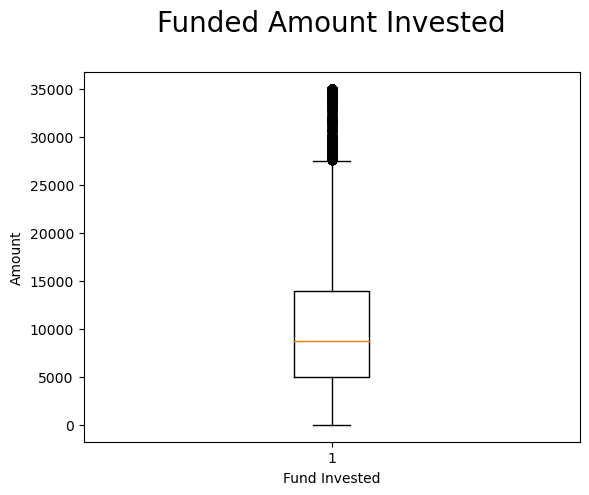

In [62]:
# using boxplot to check for outliers in 'funded_amt_inv'

plt.boxplot(lcd_6['funded_amnt_inv'])

# Adding and formatting title
plt.title("Funded Amount Invested\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Fund Invested", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})

plt.show()

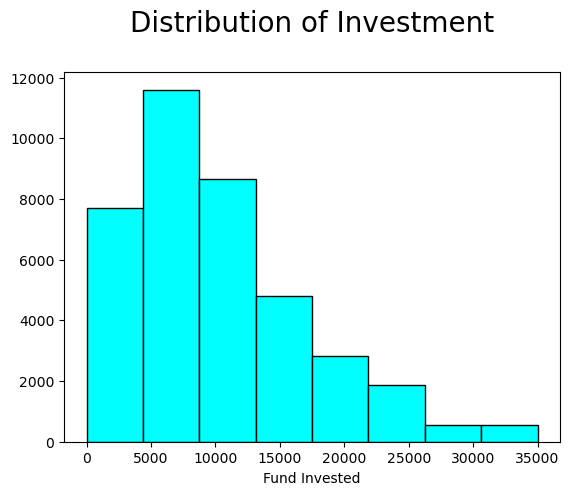

In [63]:
# using histogram to look into the distrubution of funded amount invested

plt.hist(lcd_6['funded_amnt_inv'], bins = 8, edgecolor='black',color='cyan')

# Adding and formatting title
plt.title("Distribution of Investment\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Fund Invested", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
#plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})


plt.show()

Looking at the distribution we can say that the maximum number of loans given out are between 0 to 15000.

In [64]:
#binning funded amount invested

inv_bins = [float('-inf'), 5000.0, 15000.0, 20000.0, 35000.0] 
inv_ranges = ["0 to 5000", "5000 to 15000", "15000 to 20000", "Above 20000"]

lcd_6['funded_amnt_cat'] = pd.cut(lcd_6['funded_amnt_inv'], 
                                     bins = inv_bins,
                                     labels = inv_ranges)

C:\Users\Tamal\AppData\Local\Temp\ipykernel_15752\2176087558.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lcd_6['funded_amnt_cat'] = pd.cut(lcd_6['funded_amnt_inv'],


In [65]:
lcd_6.head()

,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,loan_status_cat,funded_amnt_cat
0,4975.0,36 months,10.65,162.87,B,B2,10+ years,RENT,24000.0,Verified,01-12-2011,Fully Paid,credit_card,860xx,AZ,27.65,0,0 to 5000
1,2500.0,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,01-12-2011,Charged Off,car,309xx,GA,1.00,1,0 to 5000
2,2400.0,36 months,15.96,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,01-12-2011,Fully Paid,small_business,606xx,IL,8.72,0,0 to 5000
3,10000.0,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,01-12-2011,Fully Paid,other,917xx,CA,20.00,0,5000 to 15000
5,5000.0,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,01-12-2011,Fully Paid,wedding,852xx,AZ,11.20,0,0 to 5000


In [66]:
lcd_6['funded_amnt_cat'].value_counts()

5000 to 15000     20374
0 to 5000         10701
15000 to 20000     3984
Above 20000        3518
Name: funded_amnt_cat, dtype: int64

In [67]:
lcd_6['int_rate'].describe()

count    38577.000000
mean        11.932219
std          3.691327
min          5.420000
25%          8.940000
50%         11.710000
75%         14.380000
max         24.400000
Name: int_rate, dtype: float64

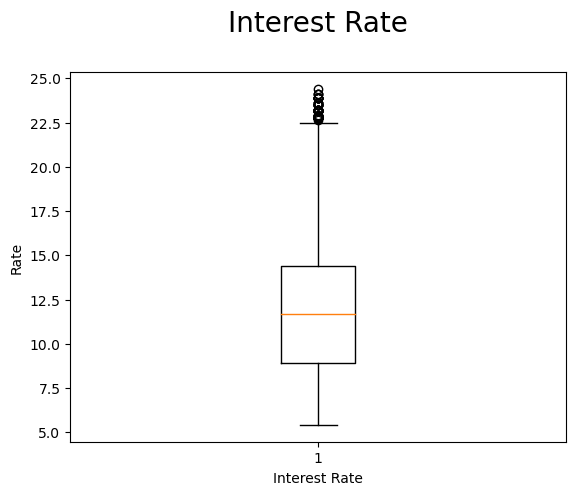

In [68]:
# using boxplot to check for outliers in 'int_rate'

plt.boxplot(lcd_6['int_rate'])

# Adding and formatting title
plt.title("Interest Rate\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Interest Rate", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
plt.ylabel("Rate", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})

plt.show()

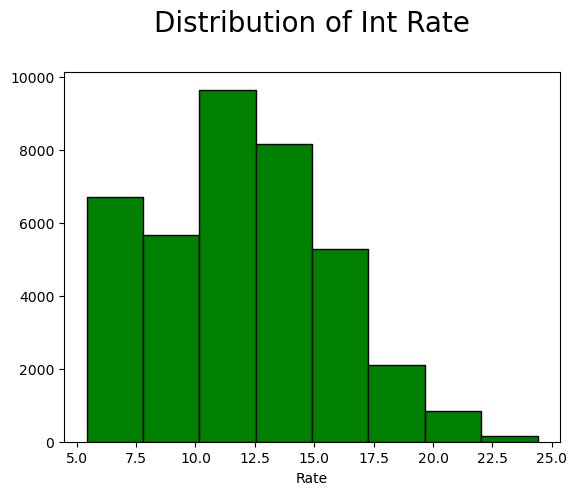

In [69]:
# using histogram to look into the distrubution of Rate of interest

plt.hist(lcd_6['int_rate'], bins = 8, edgecolor='black',color='green')

# Adding and formatting title
plt.title("Distribution of Int Rate\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Rate", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
#plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})


plt.show()

Looking at the distribution we can infer that the general interest rate at which loans are given varies between 5% to 15%.

In [70]:
#binning Interest Rate

rate_bins = [5.0, 10.0, 15.0, 25.0] 
rate_ranges = ["5% to 10%", "10% to 15%", "Above 15%"]

lcd_6['int_rate_cat'] = pd.cut(lcd_6['int_rate'], 
                                     bins = rate_bins,
                                     labels = rate_ranges)

C:\Users\Tamal\AppData\Local\Temp\ipykernel_15752\3703080123.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lcd_6['int_rate_cat'] = pd.cut(lcd_6['int_rate'],


In [71]:
lcd_6['int_rate_cat'].value_counts()

10% to 15%    18265
5% to 10%     12316
Above 15%      7996
Name: int_rate_cat, dtype: int64

installment: The monthly payment owed by the borrower if the loan originates. (From Data Dictionary)

In [72]:
lcd_6['installment'].describe()

count    38577.000000
mean       322.466318
std        208.639215
min         15.690000
25%        165.740000
50%        277.860000
75%        425.550000
max       1305.190000
Name: installment, dtype: float64

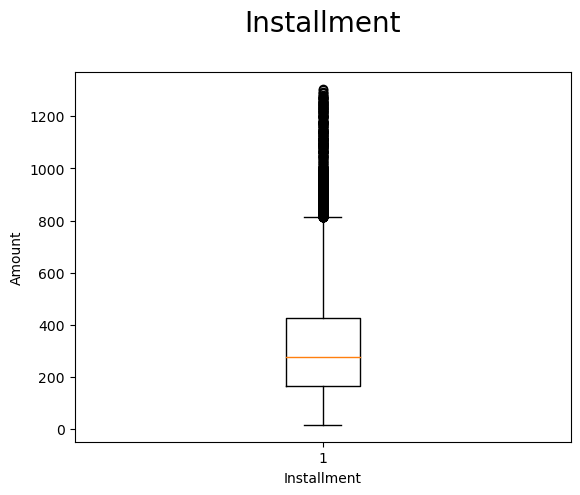

In [73]:
# using boxplot to check for outliers in 'installment'

plt.boxplot(lcd_6['installment'])

# Adding and formatting title
plt.title("Installment\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Installment", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})

plt.show()

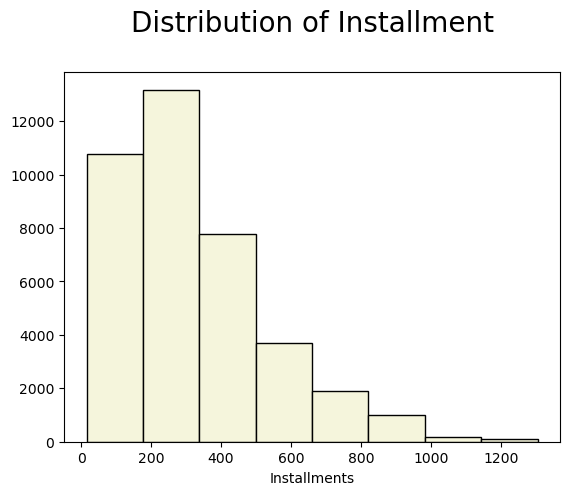

In [74]:
# using histogram to look into the distrubution of Amount of Installment

plt.hist(lcd_6['installment'], bins = 8, edgecolor='black',color='beige')

# Adding and formatting title
plt.title("Distribution of Installment\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Installments", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
#plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})


plt.show()

Maximum amount of installment payments revolve arount 0 to 500. The installment amount increases as the loan amount increases.

In [75]:
#Checking correlation between funded amount invested and installment amount

(lcd_6['funded_amnt_inv'].corr(lcd_6['installment']))*100

90.54639609153338

There is a 90% correlation between both Funded amount Invested and Installments. Therefore we can drop installments.

In [76]:
#dropping redundant columns

lcd_6 = lcd_6.drop('installment', axis = 1)
lcd_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   funded_amnt_inv      38577 non-null  float64 
 1   term                 38577 non-null  object  
 2   int_rate             38577 non-null  float64 
 3   grade                38577 non-null  object  
 4   sub_grade            38577 non-null  object  
 5   emp_length           38577 non-null  object  
 6   home_ownership       38577 non-null  object  
 7   annual_inc           38577 non-null  float64 
 8   verification_status  38577 non-null  object  
 9   issue_d              38577 non-null  object  
 10  loan_status          38577 non-null  object  
 11  purpose              38577 non-null  object  
 12  zip_code             38577 non-null  object  
 13  addr_state           38577 non-null  object  
 14  dti                  38577 non-null  float64 
 15  loan_status_cat    

annual_inc = The self-reported annual income provided by the borrower during registration. (From Data Dictionary)

In [77]:
round(lcd_6['annual_inc'].describe(),2)

count      38577.00
mean       68777.97
std        64218.68
min         4000.00
25%        40000.00
50%        58868.00
75%        82000.00
max      6000000.00
Name: annual_inc, dtype: float64

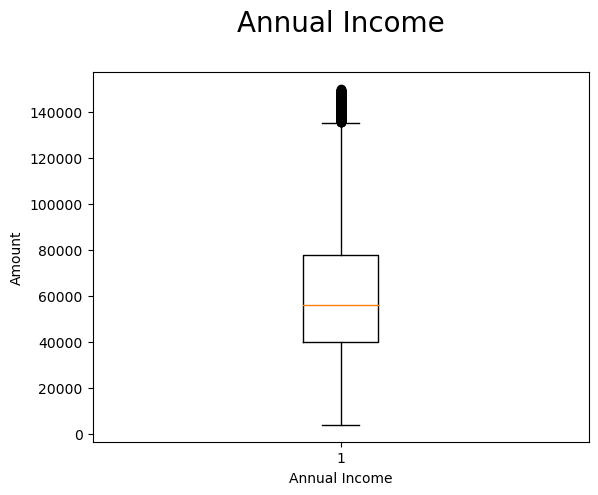

In [78]:
# using boxplot to check for outliers in 'annual_inc'

ann_inc =  lcd_6[lcd_6['annual_inc'] < 150000] #subsetting annual income because of extreme values

plt.boxplot(ann_inc['annual_inc'])

# Adding and formatting title
plt.title("Annual Income\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Annual Income", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})

plt.show()

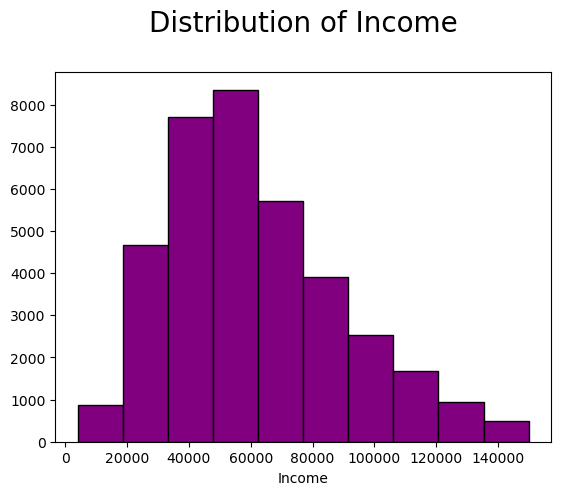

In [79]:
# using histogram to look into the distrubution of Annual Income

plt.hist(ann_inc['annual_inc'], bins = 10, edgecolor='black',color='purple')

# Adding and formatting title
plt.title("Distribution of Income\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("Income", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
#plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})


plt.show()

We can see that there are a lot of outliers in income. From the histogram we can see that majority of the income lies within 0 to 150000. We will be binning accordingly.

In [80]:
#binning Annual Income

inc_bins = [0.0, 25000.0, 50000.0, 75000.0, 100000.0, 125000.0, 150000.0, 6000000.0] 
inc_ranges = ["0 to 25000", "25000 to 50000", "50000 to 75000", "75000 to 100000", "100000 to 125000", "125000 to 150000", "Above 150000"]

lcd_6['inc_cat'] = pd.cut(lcd_6['annual_inc'], 
                                     bins = inc_bins,
                                     labels = inc_ranges)

In [81]:
lcd_6['inc_cat'].value_counts()

25000 to 50000      12839
50000 to 75000      11668
75000 to 100000      6039
100000 to 125000     2695
0 to 25000           2550
Above 150000         1486
125000 to 150000     1300
Name: inc_cat, dtype: int64

dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income. (From Data Dictionary)

In [82]:
lcd_6['dti'].describe()

count    38577.000000
mean        13.272727
std          6.673044
min          0.000000
25%          8.130000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64

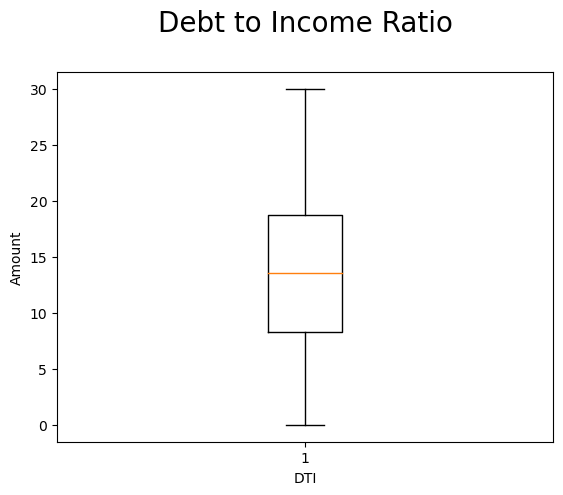

In [83]:
# using boxplot to check for outliers in 'dti'

plt.boxplot(ann_inc['dti'])

# Adding and formatting title
plt.title("Debt to Income Ratio\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("DTI", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})

plt.show()

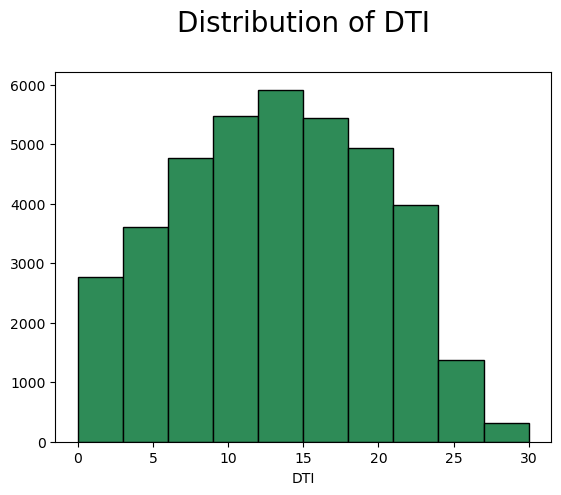

In [84]:
# using histogram to look into the distrubution of DTI

plt.hist(lcd_6['dti'], bins = 10, edgecolor='black',color='seagreen')

# Adding and formatting title
plt.title("Distribution of DTI\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("DTI", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})
#plt.ylabel("Amount", fontdict={'fontsize': 10, 'fontweight' : 5, 'color' : 'Black'})


plt.show()

The distribution of DTI is mostly between 0 to 25.

In [85]:
#binning Annual DTI

dti_bins = [float('-inf'), 5.0, 10.0, 15.0, 20.0, 25.0, 30.0] 
dti_ranges = ["Below 5", "5 to 10", "10 to 15", "15 to 20", "20 to 25", "25 to 30"]

lcd_6['dti_cat'] = pd.cut(lcd_6['dti'], 
                                     bins = dti_bins,
                                     labels = dti_ranges)

In [86]:
lcd_6['dti_cat'].value_counts()

10 to 15    9630
15 to 20    8811
5 to 10     7873
20 to 25    6578
Below 5     5062
25 to 30     623
Name: dti_cat, dtype: int64

In [87]:
#Checking for missing values

lcd_6.isnull().sum()

funded_amnt_inv        0
term                   0
int_rate               0
grade                  0
sub_grade              0
emp_length             0
home_ownership         0
annual_inc             0
verification_status    0
issue_d                0
loan_status            0
purpose                0
zip_code               0
addr_state             0
dti                    0
loan_status_cat        0
funded_amnt_cat        0
int_rate_cat           0
inc_cat                0
dti_cat                0
dtype: int64

In [88]:
lcd_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   funded_amnt_inv      38577 non-null  float64 
 1   term                 38577 non-null  object  
 2   int_rate             38577 non-null  float64 
 3   grade                38577 non-null  object  
 4   sub_grade            38577 non-null  object  
 5   emp_length           38577 non-null  object  
 6   home_ownership       38577 non-null  object  
 7   annual_inc           38577 non-null  float64 
 8   verification_status  38577 non-null  object  
 9   issue_d              38577 non-null  object  
 10  loan_status          38577 non-null  object  
 11  purpose              38577 non-null  object  
 12  zip_code             38577 non-null  object  
 13  addr_state           38577 non-null  object  
 14  dti                  38577 non-null  float64 
 15  loan_status_cat    

## Data Analysis

From the Data Dictionary:

term: The number of payments on the loan. Values are in months and can be either 36 or 60.

In [89]:
lcd_6['term'].value_counts()

 36 months    29096
 60 months     9481
Name: term, dtype: int64

In [90]:
#Checking to see how many applicants have defaulted on their respective terms

lcd_6.groupby(['term', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
term,,
36 months,3227,25869
60 months,2400,7081


In [91]:
lcd_6.groupby(['term', 'loan_status']).size()

term        loan_status
 36 months  Charged Off     3227
            Fully Paid     25869
 60 months  Charged Off     2400
            Fully Paid      7081
dtype: int64

In [92]:
lcd_6[['term', 'loan_status_cat']].groupby(['term'], as_index= False).mean()


,term,loan_status_cat
0,36 months,0.110909
1,60 months,0.253138


In [93]:
#Calculating percentage of defaulters under each term

term_def = lcd_6[['term', 'loan_status_cat']].groupby(['term'], as_index= False).mean()

term_def['%_Defaulter'] = term_def['loan_status_cat']*100

term_def

,term,loan_status_cat,%_Defaulter
0,36 months,0.110909,11.090872
1,60 months,0.253138,25.313785


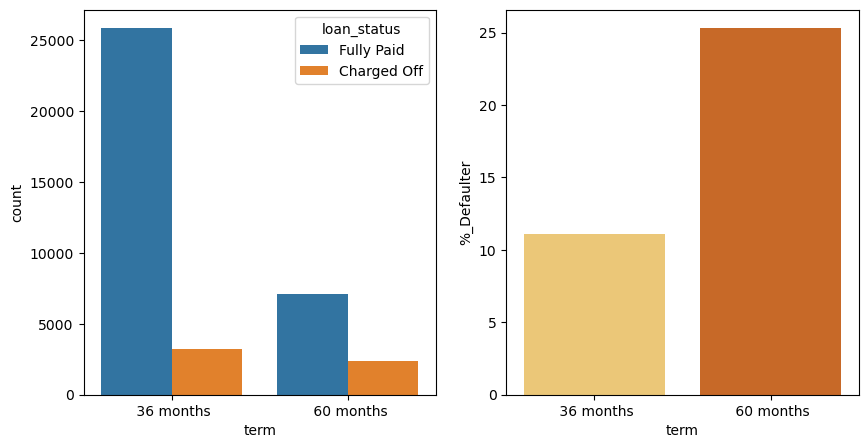

In [94]:
#Using a count plot and bar plot to show the number of defaulters on each term

plt.figure(figsize = (10, 5))

plt.subplot(1,2,1)
sns.countplot(data = lcd_6, x = 'term', hue = 'loan_status')

plt.subplot(1,2,2)
sns.barplot(data = term_def, x = 'term', y = '%_Defaulter', palette = 'YlOrBr')

plt.show()

***From the plots we can infer:***
- ***Most of the Applicants have taken a 36 month term for their loan.***
- ***An applicant is less likely to default if they are on a 36 month term.***

From Data Dictionary:

grade: LC assigned loan grade

What Is Loan Grading? <br>
Loan grading is a classification system that involves assigning a quality score to a loan based on a borrower's credit history, quality of the collateral, and the likelihood of repayment of the principal and interest. A score can also be applied to a portfolio of loans. Loan grading is part of a lending institution's loan review or credit risk system and is usually an aspect of the credit underwriting and approval processes.

There are many purposes for a loan review system, such as identifying loans with credit weaknesses so banks can take steps to minimize credit risk, identifying trends affecting the collectability of the loan portfolio, and for financial and regulatory reporting purposes.

source: https://www.investopedia.com/terms/l/loan-grading.asp

In [95]:
lcd_6['grade'].value_counts()

B    11675
A    10045
C     7834
D     5085
E     2663
F      976
G      299
Name: grade, dtype: int64

In [96]:
#Checking to see how many applicants have defaulted on their respective Grades

lcd_6.groupby(['grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
grade,,
A,602,9443
B,1425,10250
C,1347,6487
D,1118,3967
E,715,1948
F,319,657
G,101,198


In [97]:
#Calculating percentage of defaulters under each Grade

grade_def = lcd_6[['grade', 'loan_status_cat']].groupby(['grade'], as_index= False).mean()

grade_def['%_Defaulter'] = grade_def['loan_status_cat']*100

grade_def

,grade,loan_status_cat,%_Defaulter
0,A,0.059930,5.993031
1,B,0.122056,12.205567
2,C,0.171943,17.194281
3,D,0.219862,21.986234
4,E,0.268494,26.849418
5,F,0.326844,32.684426
6,G,0.337793,33.779264


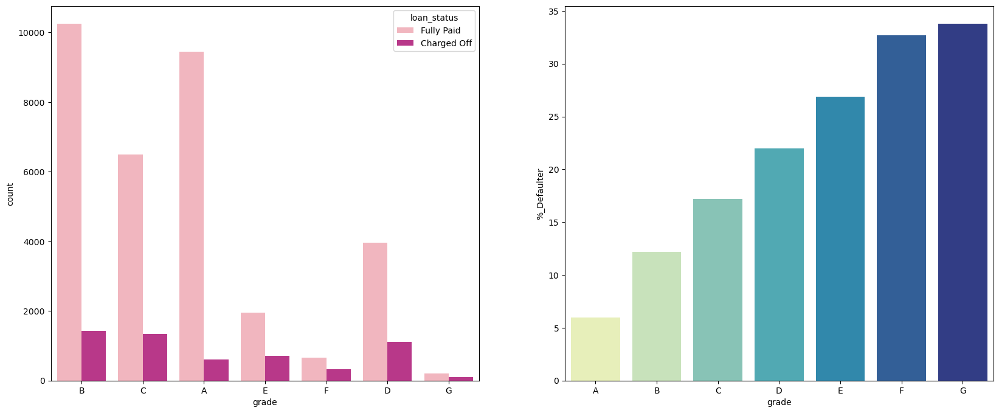

In [146]:
#Using a count plot and bar plot to show the number of defaulters on each Grade

plt.figure(figsize = (20, 8))

plt.subplot(1,2,1)
sns.countplot(data = lcd_6, x = 'grade', hue = 'loan_status', palette = 'RdPu')

plt.subplot(1,2,2)
sns.barplot(data = grade_def, x = 'grade', y = '%_Defaulter', palette = 'YlGnBu')

plt.show()

***From the plots we can infer:***
- ***Most of the Applicants with Grades A, B, C have taken the most loans.***
- ***An applicants with Grades E, F, G are most likely to default on their loans.***

From Data Dictionary:

sub_grade: LC assigned loan subgrade. Each Grade has a seperate subgrade and we will do an analysis based on that.

In [99]:
lcd_6['sub_grade'].value_counts().sort_values()

G5      29
G3      45
G4      54
G2      77
G1      94
F5     113
F4     151
F3     174
F2     233
F1     305
E5     387
E4     424
E3     516
E2     614
E1     722
D5     834
D4     918
D1     931
D3    1116
A1    1139
C5    1154
C4    1206
D2    1286
C3    1488
A2    1508
B1    1797
A3    1810
C2    1931
B2    2001
C1    2055
B4    2437
B5    2615
A5    2715
B3    2825
A4    2873
Name: sub_grade, dtype: int64

In [100]:
#Subsetting based on Grades

lcd_6_A = lcd_6[lcd_6['grade'] == "A"]
lcd_6_B = lcd_6[lcd_6['grade'] == "B"]
lcd_6_C = lcd_6[lcd_6['grade'] == "C"]
lcd_6_D = lcd_6[lcd_6['grade'] == "D"]
lcd_6_E = lcd_6[lcd_6['grade'] == "E"]
lcd_6_F = lcd_6[lcd_6['grade'] == "F"]
lcd_6_G = lcd_6[lcd_6['grade'] == "G"]

print(lcd_6_A['sub_grade'].value_counts())
print(lcd_6_B['sub_grade'].value_counts())
print(lcd_6_C['sub_grade'].value_counts())
print(lcd_6_D['sub_grade'].value_counts())
print(lcd_6_E['sub_grade'].value_counts())
print(lcd_6_F['sub_grade'].value_counts())
print(lcd_6_G['sub_grade'].value_counts())

A4    2873
A5    2715
A3    1810
A2    1508
A1    1139
Name: sub_grade, dtype: int64
B3    2825
B5    2615
B4    2437
B2    2001
B1    1797
Name: sub_grade, dtype: int64
C1    2055
C2    1931
C3    1488
C4    1206
C5    1154
Name: sub_grade, dtype: int64
D2    1286
D3    1116
D1     931
D4     918
D5     834
Name: sub_grade, dtype: int64
E1    722
E2    614
E3    516
E4    424
E5    387
Name: sub_grade, dtype: int64
F1    305
F2    233
F3    174
F4    151
F5    113
Name: sub_grade, dtype: int64
G1    94
G2    77
G4    54
G3    45
G5    29
Name: sub_grade, dtype: int64


In [101]:
#Checking to see how many applicants have defaulted on Subrade A

lcd_6_A.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
A1,30,1109
A2,74,1434
A3,103,1707
A4,178,2695
A5,217,2498


In [102]:
#Checking to see how many applicants have defaulted on Subrade B

lcd_6_B.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
B1,171,1626
B2,228,1773
B3,341,2484
B4,329,2108
B5,356,2259


In [103]:
#Checking to see how many applicants have defaulted on Subrade C

lcd_6_C.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
C1,336,1719
C2,321,1610
C3,270,1218
C4,212,994
C5,208,946


In [104]:
#Checking to see how many applicants have defaulted on Subrade D

lcd_6_D.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
D1,167,764
D2,271,1015
D3,256,860
D4,215,703
D5,209,625


In [105]:
#Checking to see how many applicants have defaulted on Subrade E

lcd_6_E.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
E1,198,524
E2,163,451
E3,119,397
E4,126,298
E5,109,278


In [106]:
#Checking to see how many applicants have defaulted on Subrade F

lcd_6_F.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
F1,91,214
F2,70,163
F3,51,123
F4,53,98
F5,54,59


In [107]:
#Checking to see how many applicants have defaulted on Subrade G

lcd_6_G.groupby(['sub_grade', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
sub_grade,,
G1,31,63
G2,28,49
G3,19,26
G4,13,41
G5,10,19


In [108]:
#Calculating percentage of defaulters under Sub Grade A

grade_A_def = lcd_6_A[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_A_def['%_Defaulter'] = grade_A_def['loan_status_cat']*100

grade_A_def

,sub_grade,loan_status_cat,%_Defaulter
0,A1,0.026339,2.633889
1,A2,0.049072,4.907162
2,A3,0.056906,5.690608
3,A4,0.061956,6.195614
4,A5,0.079926,7.992634


In [109]:
#Calculating percentage of defaulters under Sub Grade B

grade_B_def = lcd_6_B[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_B_def['%_Defaulter'] = grade_B_def['loan_status_cat']*100

grade_B_def

,sub_grade,loan_status_cat,%_Defaulter
0,B1,0.095159,9.515860
1,B2,0.113943,11.394303
2,B3,0.120708,12.070796
3,B4,0.135002,13.500205
4,B5,0.136138,13.613767


In [110]:
#Calculating percentage of defaulters under Sub Grade C

grade_C_def = lcd_6_C[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_C_def['%_Defaulter'] = grade_C_def['loan_status_cat']*100

grade_C_def

,sub_grade,loan_status_cat,%_Defaulter
0,C1,0.163504,16.350365
1,C2,0.166235,16.623511
2,C3,0.181452,18.145161
3,C4,0.175788,17.578773
4,C5,0.180243,18.024263


In [111]:
#Calculating percentage of defaulters under Sub Grade D

grade_D_def = lcd_6_D[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_D_def['%_Defaulter'] = grade_D_def['loan_status_cat']*100

grade_D_def

,sub_grade,loan_status_cat,%_Defaulter
0,D1,0.179377,17.937701
1,D2,0.210731,21.073095
2,D3,0.229391,22.939068
3,D4,0.234205,23.420479
4,D5,0.250600,25.059952


In [112]:
#Calculating percentage of defaulters under Sub Grade E

grade_E_def = lcd_6_E[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_E_def['%_Defaulter'] = grade_E_def['loan_status_cat']*100

grade_E_def

,sub_grade,loan_status_cat,%_Defaulter
0,E1,0.274238,27.423823
1,E2,0.265472,26.547231
2,E3,0.230620,23.062016
3,E4,0.297170,29.716981
4,E5,0.281654,28.165375


In [113]:
#Calculating percentage of defaulters under Sub Grade F

grade_F_def = lcd_6_F[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_F_def['%_Defaulter'] = grade_F_def['loan_status_cat']*100

grade_F_def

,sub_grade,loan_status_cat,%_Defaulter
0,F1,0.298361,29.836066
1,F2,0.300429,30.042918
2,F3,0.293103,29.310345
3,F4,0.350993,35.099338
4,F5,0.477876,47.787611


In [114]:
#Calculating percentage of defaulters under Sub Grade G

grade_G_def = lcd_6_G[['sub_grade', 'loan_status_cat']].groupby(['sub_grade'], as_index= False).mean()

grade_G_def['%_Defaulter'] = grade_G_def['loan_status_cat']*100

grade_G_def

,sub_grade,loan_status_cat,%_Defaulter
0,G1,0.329787,32.978723
1,G2,0.363636,36.363636
2,G3,0.422222,42.222222
3,G4,0.240741,24.074074
4,G5,0.344828,34.482759


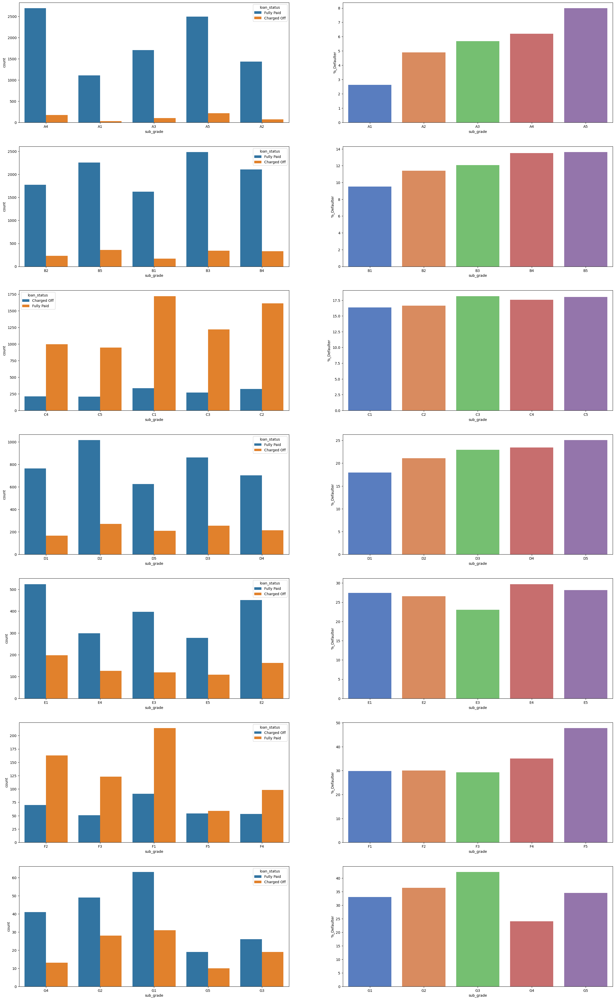

In [115]:
#Using a count plot and bar plot to show the number of defaulters on each Sub Grade

plt.figure(figsize = (30, 50))

plt.subplot(7,2,1)
sns.countplot(data = lcd_6_A, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,2)
sns.barplot(data = grade_A_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.subplot(7,2,3)
sns.countplot(data = lcd_6_B, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,4)
sns.barplot(data = grade_B_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.subplot(7,2,5)
sns.countplot(data = lcd_6_C, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,6)
sns.barplot(data = grade_C_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.subplot(7,2,7)
sns.countplot(data = lcd_6_D, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,8)
sns.barplot(data = grade_D_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.subplot(7,2,9)
sns.countplot(data = lcd_6_E, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,10)
sns.barplot(data = grade_E_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.subplot(7,2,11)
sns.countplot(data = lcd_6_F, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,12)
sns.barplot(data = grade_F_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.subplot(7,2,13)
sns.countplot(data = lcd_6_G, x = 'sub_grade', hue = 'loan_status', palette = 'tab10')

plt.subplot(7,2,14)
sns.barplot(data = grade_G_def, x = 'sub_grade', y = '%_Defaulter', palette = 'muted')

plt.show()

***From the plots we can infer:***
- ***An Applicant's is likely to default if their sub grade is lower, i.e., Sub Grade 5 is more likeyly to default than 1.***
- ***As we move down the Grades the percentage of Defaulters becomes higher. The percentage of defaulters within the sub grades become more stable.***

From Data Dictionary

emp_length: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

In [116]:
lcd_6['emp_length'].value_counts()

10+ years    9521
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: emp_length, dtype: int64

In [117]:
#Checking to see how many applicants have defaulted on their respective employment lengths

lcd_6.groupby(['emp_length', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
emp_length,,
1 year,456,2713
10+ years,1559,7962
2 years,567,3724
3 years,555,3457
4 years,462,2880
5 years,458,2736
6 years,307,1861
7 years,263,1448
8 years,203,1232


In [118]:
#Calculating percentage of defaulters under each Employment Length

emp_length_def = lcd_6[['emp_length', 'loan_status_cat']].groupby(['emp_length'], as_index= False).mean()

emp_length_def['%_Defaulter'] = emp_length_def['loan_status_cat']*100

emp_length_def

,emp_length,loan_status_cat,%_Defaulter
0,1 year,0.143894,14.389397
1,10+ years,0.163743,16.374330
2,2 years,0.132137,13.213703
3,3 years,0.138335,13.833500
4,4 years,0.138241,13.824057
5,5 years,0.143394,14.339386
6,6 years,0.141605,14.160517
7,7 years,0.153711,15.371128
8,8 years,0.141463,14.146341
9,9 years,0.128874,12.887439


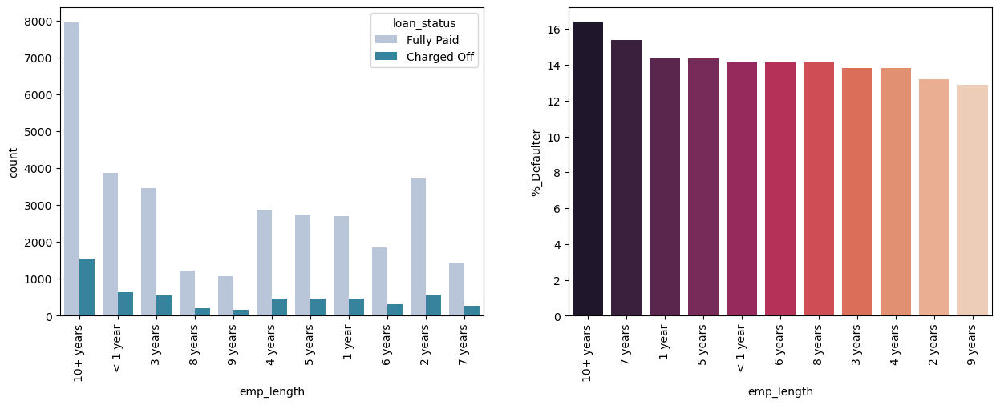

In [119]:
#Using a count plot and bar plot to show the number of defaulters under each Employment Grade

plt.figure(figsize = (15, 5))

plt.subplot(1,2,1)
sns.countplot(data = lcd_6, x = 'emp_length', hue = 'loan_status', palette = 'PuBuGn')
plt.xticks(rotation = 90)

plt.subplot(1,2,2)
sns.barplot(data = emp_length_def, x = 'emp_length', y = '%_Defaulter', order= emp_length_def.sort_values('%_Defaulter', ascending = False).emp_length,  palette = 'rocket')
plt.xticks(rotation = 90)

plt.show()

***From the plots we can infer:***
- ***Most number of loans have been Applicants who have a 10+ years of employment.***
- ***Most defaulters have also come from Applicants who have 10+ years of employment.***
- ***Applicants who are within the 1st year or with 1 year of employement are more likely to default as they have a default rate of 14%.***
- ***Applicants who with an employement tenure of 2 to 5 years have a high likelyhood of taking loans and a default rate which varies from 10% to 14%.***

- ***Applicants with an employment experience of 6 to 9 years are less likely to take a loan and are less likely to default. Although we can see 7 years have the 2nd highest default rate but the count of loans is also less.***

From Data Dictionary:

home_ownership: The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

In [120]:
lcd_6['home_ownership'].value_counts()

RENT        18480
MORTGAGE    17021
OWN          2975
OTHER          98
NONE            3
Name: home_ownership, dtype: int64

In [121]:
#Checking to see how many applicants have defaulted on their Home Ownership type

lcd_6.groupby(['home_ownership', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
home_ownership,,
MORTGAGE,2327,14694
NONE,0,3
OTHER,18,80
OWN,443,2532
RENT,2839,15641


In [122]:
#Calculating percentage of defaulters under each Employment Length

home_ownership_def = lcd_6[['home_ownership', 'loan_status_cat']].groupby(['home_ownership'], as_index= False).mean()

home_ownership_def['%_Defaulter'] = home_ownership_def['loan_status_cat']*100

home_ownership_def

,home_ownership,loan_status_cat,%_Defaulter
0,MORTGAGE,0.136713,13.671347
1,NONE,0.000000,0.000000
2,OTHER,0.183673,18.367347
3,OWN,0.148908,14.890756
4,RENT,0.153626,15.362554


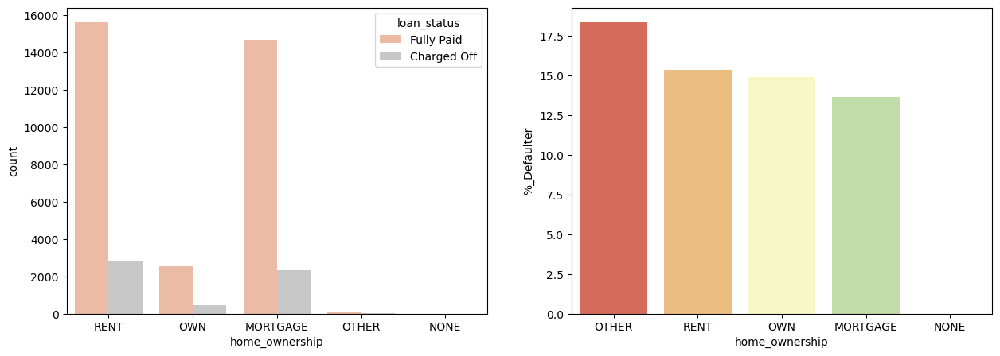

In [123]:
#Using a count plot and bar plot to show the number of defaulters under each Employment Grade

plt.figure(figsize = (15, 5))

plt.subplot(1,2,1)
sns.countplot(data = lcd_6, x = 'home_ownership', hue = 'loan_status', palette = 'RdGy')

plt.subplot(1,2,2)
sns.barplot(data = home_ownership_def, x = 'home_ownership', y = '%_Defaulter', order= home_ownership_def.sort_values('%_Defaulter', ascending = False).home_ownership,  palette = 'Spectral')

plt.show()

***From the plots we can infer:***
- ***Maximum loans have been taken by Applicants who are are paying Rent or Mortages.***
- ***Applicants who are paying Rent or Mortgages are also highly likely to default.***
- ***Applicants who Own their own house are less likely to take a loan.***

From Data Dictionary:
    
verification_status: Indicates if income was verified by LC, not verified, or if the income source was verified

In [124]:
lcd_6['verification_status'].value_counts()

Not Verified       16694
Verified           12206
Source Verified     9677
Name: verification_status, dtype: int64

Note: Source Verified also falls under verified sources so we will make that change.

In [125]:
# Replacing 'Source Verified' as 'Verified' in verification_status

lcd_6['verification_status'] = lcd_6['verification_status'].apply(lambda x: x.replace('Source Verified','Verified'))

In [126]:
#Checking to see how many applicants have defaulted with their Income Source Verification Status

lcd_6.groupby(['verification_status', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
verification_status,,
Not Verified,2142,14552
Verified,3485,18398


In [127]:
#Calculating percentage of defaulters with Income Source Verification Status

verification_def = lcd_6[['verification_status', 'loan_status_cat']].groupby(['verification_status'], as_index= False).mean()

verification_def['%_Defaulter'] = verification_def['loan_status_cat']*100

verification_def

,verification_status,loan_status_cat,%_Defaulter
0,Not Verified,0.128310,12.830957
1,Verified,0.159256,15.925604


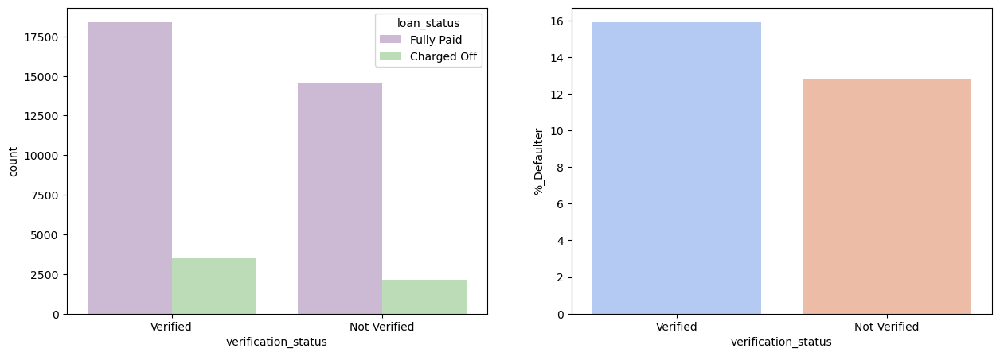

In [128]:
#Using a count plot and bar plot to show the number of defaulters with Income Source Verification Status

plt.figure(figsize = (15, 5))

plt.subplot(1,2,1)
sns.countplot(data = lcd_6, x = 'verification_status', hue = 'loan_status', palette = 'PRGn')

plt.subplot(1,2,2)
sns.barplot(data = verification_def, x = 'verification_status', y = '%_Defaulter', order= verification_def.sort_values('%_Defaulter', ascending = False).verification_status,  palette = 'coolwarm')

plt.show()

***From the plots we can infer that:***
- ***Applicants with a Verified income source have been given higher number of loans. Although from the bar plot we can see that under verified sources have a higher default rate.***
- ***Given a higher default rate under Verfied Sources we can assume that a higher number of loans will incur a higher number of defaulters.***

From Data Dictionary:

purpose: A category provided by the borrower for the loan request.

In [133]:
lcd_6['purpose'].value_counts()

debt_consolidation    18055
credit_card            5027
other                  3865
home_improvement       2875
major_purchase         2150
small_business         1754
car                    1499
wedding                 926
medical                 681
moving                  576
vacation                375
house                   367
educational             325
renewable_energy        102
Name: purpose, dtype: int64

In [134]:
#Checking to see how many applicants have defaulted with respect to their purpose of loan

lcd_6.groupby(['purpose', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
purpose,,
car,160,1339
credit_card,542,4485
debt_consolidation,2767,15288
educational,56,269
home_improvement,347,2528
house,59,308
major_purchase,222,1928
medical,106,575
moving,92,484


In [135]:
#Calculating percentage of defaulters with respect to purpose of taking loan

purpose_def = lcd_6[['purpose', 'loan_status_cat']].groupby(['purpose'], as_index= False).mean()

purpose_def['%_Defaulter'] = purpose_def['loan_status_cat']*100

purpose_def

,purpose,loan_status_cat,%_Defaulter
0,car,0.106738,10.673783
1,credit_card,0.107818,10.781778
2,debt_consolidation,0.153254,15.325395
3,educational,0.172308,17.230769
4,home_improvement,0.120696,12.069565
5,house,0.160763,16.076294
6,major_purchase,0.103256,10.325581
7,medical,0.155653,15.565345
8,moving,0.159722,15.972222
9,other,0.163777,16.377749


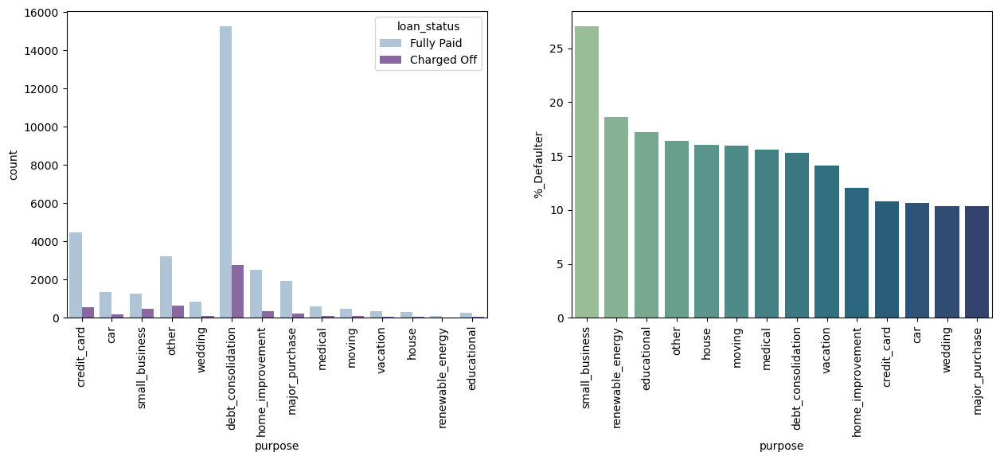

In [138]:
#Using a count plot and bar plot to show the number of defaulters with Income Source Verification Status

plt.figure(figsize = (15, 5))

plt.subplot(1,2,1)
sns.countplot(data = lcd_6, x = 'purpose', hue = 'loan_status', palette = 'BuPu')
plt.xticks(rotation = 90)

plt.subplot(1,2,2)
sns.barplot(data = purpose_def, x = 'purpose', y = '%_Defaulter', order= purpose_def.sort_values('%_Defaulter', ascending = False).purpose,  palette = 'crest')
plt.xticks(rotation = 90)

plt.show()

***From the plots we can infer that:***

- ***Most applicants have taken loans for Debt Consolidation and Credit Card with a default rate ranging from 10% to 15%.***
- ***Applicants who have taken loans for Small Business have the highest default rate making them risky investments.***
- ***Applicants who have taken loans for a Major Purchase, Wedding, Car have the lowest default rate.***

In [129]:
lcd_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   funded_amnt_inv      38577 non-null  float64 
 1   term                 38577 non-null  object  
 2   int_rate             38577 non-null  float64 
 3   grade                38577 non-null  object  
 4   sub_grade            38577 non-null  object  
 5   emp_length           38577 non-null  object  
 6   home_ownership       38577 non-null  object  
 7   annual_inc           38577 non-null  float64 
 8   verification_status  38577 non-null  object  
 9   issue_d              38577 non-null  object  
 10  loan_status          38577 non-null  object  
 11  purpose              38577 non-null  object  
 12  zip_code             38577 non-null  object  
 13  addr_state           38577 non-null  object  
 14  dti                  38577 non-null  float64 
 15  loan_status_cat    

From Data Dictionary:
    
int_rate: Interest Rate on the loan.

In [148]:
#Checking to see how many applicants have defaulted with respect to interest rates

lcd_6.groupby(['int_rate_cat', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
int_rate_cat,,
5% to 10%,830,11486
10% to 15%,2707,15558
Above 15%,2090,5906


In [149]:
#Calculating percentage of defaulters with respect to Interest Rate

int_rate_def = lcd_6[['int_rate_cat', 'loan_status_cat']].groupby(['int_rate_cat'], as_index= False).mean()

int_rate_def['%_Defaulter'] = int_rate_def['loan_status_cat']*100

int_rate_def

,int_rate_cat,loan_status_cat,%_Defaulter
0,5% to 10%,0.067392,6.739201
1,10% to 15%,0.148207,14.820695
2,Above 15%,0.261381,26.138069


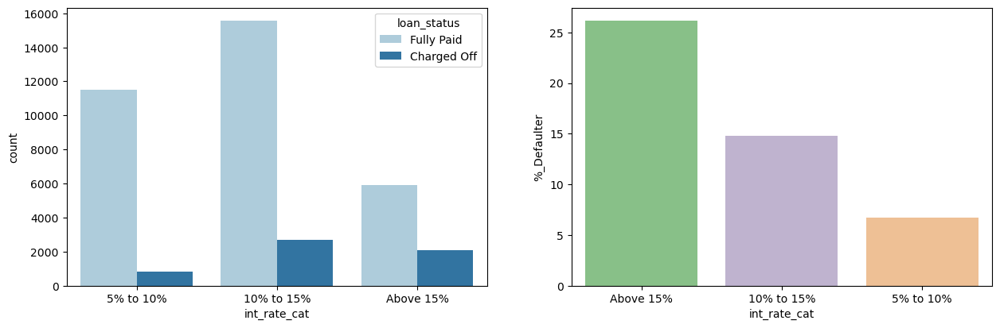

In [180]:
#Using a count plot and bar plot to show the number of defaulters with Income Source Verification Status

plt.figure(figsize = (15, 10))

plt.subplot(2,2,1)
sns.countplot(data = lcd_6, x = 'int_rate_cat', hue = 'loan_status', palette = 'Paired')

plt.subplot(2,2,2)
sns.barplot(data = int_rate_def, x = 'int_rate_cat', y = '%_Defaulter', order= int_rate_def.sort_values('%_Defaulter', ascending = False).int_rate_cat, palette = 'Accent')

plt.show()

***From the plots we can infer that:***

- ***Loans given out with an Interest Rate of 5% to 10% as the least likely to default, with a default rate below 10%.***
- ***Loans given out with an Interest Rate of 10% to 15% has a default rate of 15%.***
- ***Loans with more than 15% Rate of interest are most likely to default.***
- ***Higher interest rates leads to a higher default rate.***


From Data Dictionary:

funded_amnt_inv: The total amount committed by investors for that loan at that point in time.

In [175]:
lcd_6['funded_amnt_cat'].value_counts()

5000 to 15000     20374
0 to 5000         10701
15000 to 20000     3984
Above 20000        3518
Name: funded_amnt_cat, dtype: int64

In [176]:
#Checking to see how many applicants have defaulted with respect to Funded Amount Invested

lcd_6.groupby(['funded_amnt_cat', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
funded_amnt_cat,,
0 to 5000,1580,9121
5000 to 15000,2675,17699
15000 to 20000,713,3271
Above 20000,659,2859


In [178]:
#Calculating percentage of defaulters with respect to Interest Rate

funded_amnt_def = lcd_6[['funded_amnt_cat', 'loan_status_cat']].groupby(['funded_amnt_cat'], as_index= False).mean()

funded_amnt_def['%_Defaulter'] = funded_amnt_def['loan_status_cat']*100

funded_amnt_def

,funded_amnt_cat,loan_status_cat,%_Defaulter
0,0 to 5000,0.147650,14.764975
1,5000 to 15000,0.131295,13.129479
2,15000 to 20000,0.178966,17.896586
3,Above 20000,0.187322,18.732234


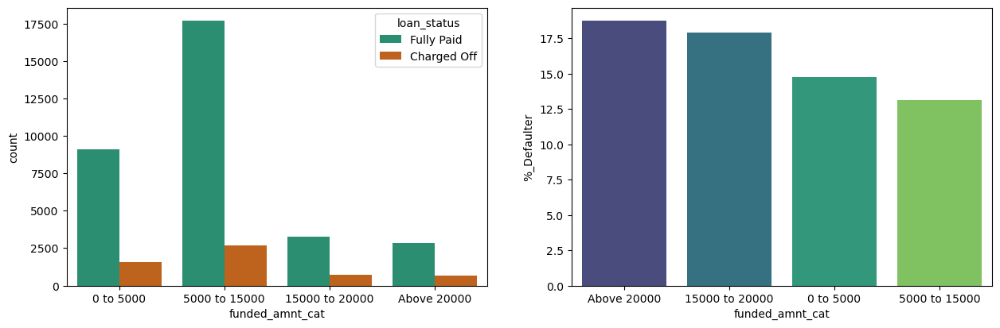

In [184]:
#Using a count plot and bar plot to show the number of defaulters with Funded Amount Invested

plt.figure(figsize = (15, 10))

plt.subplot(2,2,1)
sns.countplot(data = lcd_6, x = 'funded_amnt_cat', hue = 'loan_status', palette = 'Dark2')

plt.subplot(2,2,2)
sns.barplot(data = funded_amnt_def, x = 'funded_amnt_cat', y = '%_Defaulter', order= funded_amnt_def.sort_values('%_Defaulter', ascending = False).funded_amnt_cat, palette = 'viridis')

plt.show()

***From the plots we can infer that:***

- ***An applicant is more likely to take a loan within 10000 to 15000 and it has the least default rate.***
- ***Higher loan amount has a higher rate of default.***

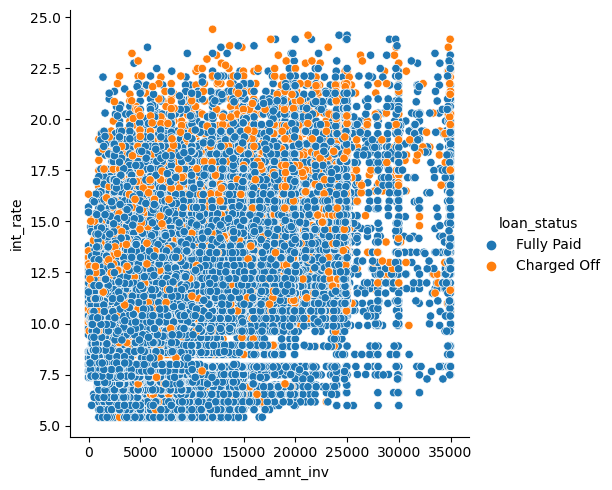

In [167]:
# Using Scatter Plot to find out correlation of interest rate, fund amount invested and defaulters

sns.relplot(data=lcd_6, x="funded_amnt_inv", y="int_rate", hue = "loan_status")

plt.show()

***From the plots we can infer that:***

- ***Here we can summarize that amount invested for lower rate of interest is quite safe. But if the interest rate increases then the amount invested does not make a difference and has a high chance of default.***
- ***Lower interest rate means Less Defaults***

In [195]:
#Checking to see how many applicants have defaulted with respect to Annual Income

lcd_6.groupby(['inc_cat', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
inc_cat,,
0 to 25000,488,2062
25000 to 50000,2125,10714
50000 to 75000,1686,9982
75000 to 100000,736,5303
100000 to 125000,293,2402
125000 to 150000,136,1164
Above 150000,163,1323


In [198]:
#Calculating percentage of defaulters with respect to Annual Income

ann_inc_def = lcd_6[['inc_cat', 'loan_status_cat']].groupby(['inc_cat'], as_index= False).mean()

ann_inc_def['%_Defaulter'] = ann_inc_def['loan_status_cat']*100

ann_inc_def

,inc_cat,loan_status_cat,%_Defaulter
0,0 to 25000,0.191373,19.137255
1,25000 to 50000,0.165511,16.551133
2,50000 to 75000,0.144498,14.449777
3,75000 to 100000,0.121874,12.187448
4,100000 to 125000,0.108720,10.871985
5,125000 to 150000,0.104615,10.461538
6,Above 150000,0.109690,10.969044


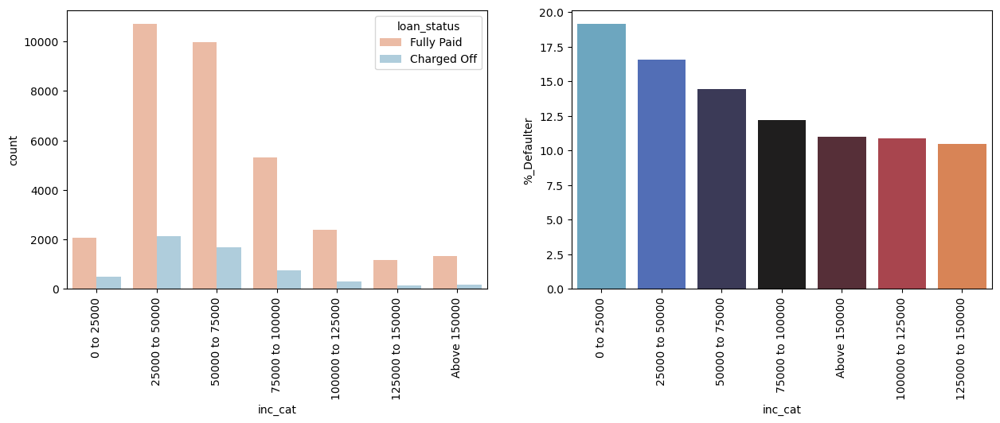

In [202]:
#Using a count plot and bar plot to show the number of defaulters with Annual Income

plt.figure(figsize = (15, 10))

plt.subplot(2,2,1)
sns.countplot(data = lcd_6, x = 'inc_cat', hue = 'loan_status', palette = 'RdBu')
plt.xticks(rotation = 90)

plt.subplot(2,2,2)
sns.barplot(data = ann_inc_def, x = 'inc_cat', y = '%_Defaulter', order= ann_inc_def.sort_values('%_Defaulter', ascending = False).inc_cat, palette = 'icefire')
plt.xticks(rotation = 90)

plt.show()

***From the plots we can infer that:***
- ***Applicants within an income group of 25000 to 75000 are most likely to take a loan.***
- ***Applicants in the higher income groups are less likely to default.***

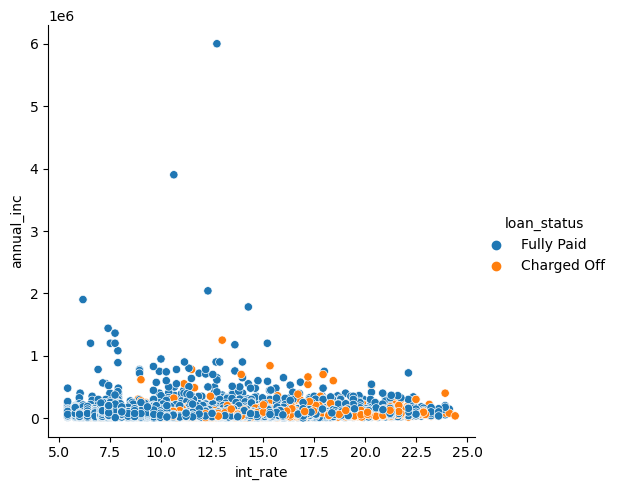

In [193]:
# Using Scatter Plot to find out correlation of interest rate, annual income and defaulters

sns.relplot(data=lcd_6, x="int_rate", y="annual_inc", hue = "loan_status")
plt.show()

***From the plots we can infer that:***

- ***Here We can summarize that Low interest rate regardless of annual income is safe. But if the interest rate increases With no increase of annual income then default rate is high.***
- ***We Already know lower interest rate means less defaults, but if annual income is good then we can charge Higher rate of interest  and it is less likely to default.***

In [209]:
#Checking to see how many applicants have defaulted with respect to DTI

lcd_6.groupby(['dti_cat', 'loan_status']).size().unstack(fill_value = 0)

loan_status,Charged Off,Fully Paid
dti_cat,,
Below 5,626,4436
5 to 10,1005,6868
10 to 15,1402,8228
15 to 20,1389,7422
20 to 25,1118,5460
25 to 30,87,536


In [210]:
#Calculating percentage of defaulters with respect to DTI

dti_def = lcd_6[['dti_cat', 'loan_status_cat']].groupby(['dti_cat'], as_index= False).mean()

dti_def['%_Defaulter'] = dti_def['loan_status_cat']*100

dti_def

,dti_cat,loan_status_cat,%_Defaulter
0,Below 5,0.123667,12.366653
1,5 to 10,0.127651,12.765147
2,10 to 15,0.145587,14.558671
3,15 to 20,0.157644,15.764385
4,20 to 25,0.169960,16.996047
5,25 to 30,0.139647,13.964687


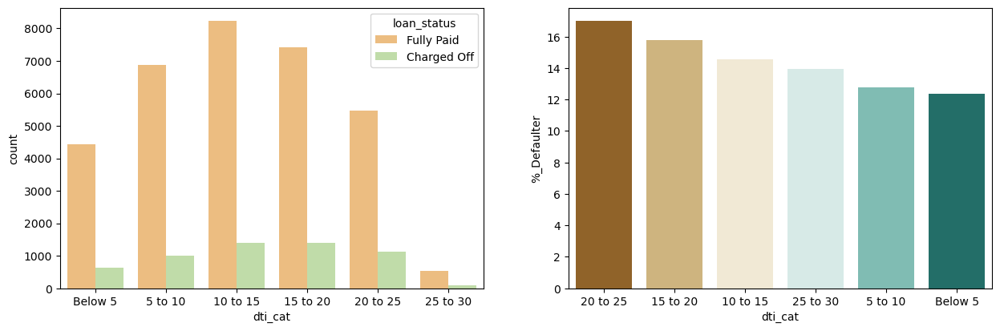

In [214]:
#Using a count plot and bar plot to show the number of defaulters with Income Source Verification Status

plt.figure(figsize = (15, 10))

plt.subplot(2,2,1)
sns.countplot(data = lcd_6, x = 'dti_cat', hue = 'loan_status', palette = 'Spectral')

plt.subplot(2,2,2)
sns.barplot(data = dti_def, x = 'dti_cat', y = '%_Defaulter', order= dti_def.sort_values('%_Defaulter', ascending = False).dti_cat, palette = 'BrBG')

plt.show()

***From the plots we can infer:***

- ***A lower Debt to Income (DTI) ratio results in a lower default rate.***
- ***An Applicant with a DTI of 10 to 15 is most likely to take a loan.***

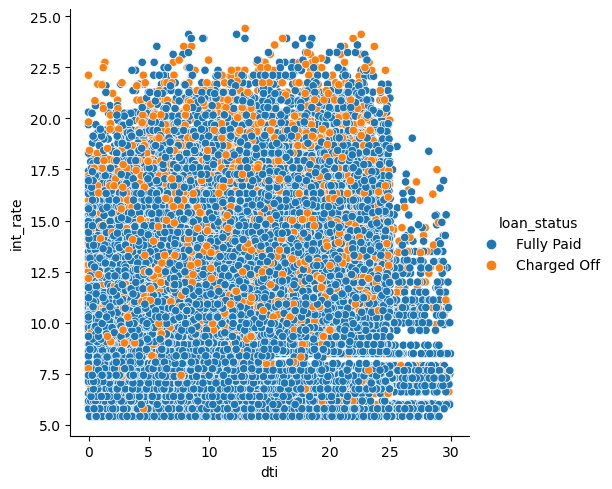

In [208]:
# Using Scatter Plot to find out correlation of interest rate, fund amount invested and defaulters

sns.relplot(data=lcd_6, x="dti", y="int_rate", hue = "loan_status")
plt.show()

***From the plots we can infer that:***


- ***Here We can summarize that Low interest rate regardless of Debt To income Ratio is safe.***

***Debt to income Ratio does not conclude trades t o have more / less defaults***

# Insights and Recomendations

- ***An Applicant is less likely to default on a 36 month term than on a 60 month term.***
- ***Lending Club should target applicants with a grade of A, B or C who have a lower default rate.***
- ***Sub grade varies from 1 to 5. Lending Club should target applicants with a lower sub grade. Lower sub grades have a lower default rate.***
- ***Lending Club should not target applicants who have an employment experience of less than 1 year since they are highly likely to default.***
- ***Lending Club should target applicants with 2 to 5 years of experiance and they are most likely to take loans.***
- ***Applicants with 6 to 9 years are less likely to take loans but they also have a lower default rate as well. Lending Club should try to target these candidates.***
- ***Applicants with 10+ years of employment experience are most likely to take a loan but this group also has the highest number of defaulters. Further investigation is required in terms of targeting this group of applicants.***
- ***Lending Club should target applicants who own their own home since they are less likely to default.***
- ***Applicants with a purpose of debt consolidation are good targets for Lending Club.***
- ***Small business applicants are highly likely to default.***
- ***A loan amount of 10000 to 15000 is what the Lending Club should aim to roll out. As the funding amount increases beyond this range the rate of default also increases.***
- ***Applicants with lower interest rates are less likely to default. Lower the interest rate the safer the investment.***
- ***Applicants with higher income are less likely to default. Best targets for Lending club would be applicants with 25000 to 75000.***
- ***Applicants with lower income and higher interest rate is definately likely to default.***
- ***Lending Club should target Applicants with lower debt to income Ratio. Applicants with low Debt to Income ratio are less likely to default.***